<a href="https://colab.research.google.com/github/spiyer99/video_remaster/blob/master/laurel_hardy_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
!pip install -q memory_profiler
%load_ext memory_profiler

In [4]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *
from pathlib import Path
import glob
import PIL
import gc
import random
from tqdm.notebook import tqdm
from torchvision.models import vgg16_bn

In [5]:
# !git clone https://github.com/iperov/DeepFaceLab

In [6]:
# !pip install -r /content/DeepFaceLab/requirements-colab.txt

# Get video

In [33]:
!pip install youtube-dl

In [88]:
VIDEO = 'inference_before.mp4'
INFERENCE_FOLDER = 'inference'

In [35]:
!rm $VIDEO
!rm 'test.mp4'

# !youtube-dl --format 136 -o seinfeld_inference1.mp4 https://www.youtube.com/watch?v=_q471WB5Tgw # conan first ep
# !youtube-dl --format best -o 'test.mp4' https://www.youtube.com/watch?v=f00IkrWvur4&feature=youtu.be # star wars new hope
# !youtube-dl --format best -o 'test.mp4' https://www.youtube.com/watch?v=maS8k1WYlIw&ab_channel=JustToons%C2%AE # looney tunes
# !youtube-dl --format best -o 'test.mp4' https://www.youtube.com/watch?v=sNh4pVMFhvQ&t=318s&ab_channel=ScottishTeeVee # oasis video
!youtube-dl --format best -o 'test.mp4' https://www.youtube.com/watch?v=fZloFqLzOC4&t=327s # laurel and hardy


rm: cannot remove 'test.mp4': No such file or directory
[youtube] fZloFqLzOC4: Downloading webpage
[download] Destination: test.mp4
[download] 100% of 75.91MiB in 00:01


In [36]:
!ffmpeg -loglevel warning -ss 00:00:00 -i 'test.mp4' -c copy -t 00:03:00.0 $VIDEO
!rm 'test.mp4'

In [37]:
!rm -rf $INFERENCE_FOLDER
!mkdir $INFERENCE_FOLDER
!mkdir $INFERENCE_FOLDER/images

In [38]:
# import glob
# from google.colab import files
# file = glob.glob(INFERENCE_FOLDER+'/images/*.jpg')[-1]
# files.download(file)

In [39]:
# cmd = "DeepFaceLab/main.py videoed extract-video --input-file seinfeld_inference.mp4 --output-dir seinfeld_inference/images --fps 0"
# !python $cmd

# Get frames from video

In [40]:
# from https://gist.github.com/HaydenFaulkner/54318fd3e9b9bdb66c5440c44e4e08b8#file-video_to_frames-py

from concurrent.futures import ProcessPoolExecutor, as_completed
import cv2
import multiprocessing
import os
import sys


def print_progress(iteration, total, prefix='', suffix='', decimals=3, bar_length=100):
    """
    Call in a loop to create standard out progress bar

    :param iteration: current iteration
    :param total: total iterations
    :param prefix: prefix string
    :param suffix: suffix string
    :param decimals: positive number of decimals in percent complete
    :param bar_length: character length of bar
    :return: None
    """

    format_str = "{0:." + str(decimals) + "f}"  # format the % done number string
    percents = format_str.format(100 * (iteration / float(total)))  # calculate the % done
    filled_length = int(round(bar_length * iteration / float(total)))  # calculate the filled bar length
    bar = '#' * filled_length + '-' * (bar_length - filled_length)  # generate the bar string
    sys.stdout.write('\r%s |%s| %s%s %s' % (prefix, bar, percents, '%', suffix)),  # write out the bar
    sys.stdout.flush()  # flush to stdout


def extract_frames(video_path, frames_dir, overwrite=False, start=-1, end=-1, every=1):
    """
    Extract frames from a video using OpenCVs VideoCapture

    :param video_path: path of the video
    :param frames_dir: the directory to save the frames
    :param overwrite: to overwrite frames that already exist?
    :param start: start frame
    :param end: end frame
    :param every: frame spacing
    :return: count of images saved
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    assert os.path.exists(video_path)  # assert the video file exists

    capture = cv2.VideoCapture(video_path)  # open the video using OpenCV

    if start < 0:  # if start isn't specified lets assume 0
        start = 0
    if end < 0:  # if end isn't specified assume the end of the video
        end = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))

    capture.set(1, start)  # set the starting frame of the capture
    frame = start  # keep track of which frame we are up to, starting from start
    while_safety = 0  # a safety counter to ensure we don't enter an infinite while loop (hopefully we won't need it)
    saved_count = 0  # a count of how many frames we have saved

    while frame < end:  # lets loop through the frames until the end

        _, image = capture.read()  # read an image from the capture

        if while_safety > 500:  # break the while if our safety maxs out at 500
            break

        # sometimes OpenCV reads None's during a video, in which case we want to just skip
        if image is None:  # if we get a bad return flag or the image we read is None, lets not save
            while_safety += 1  # add 1 to our while safety, since we skip before incrementing our frame variable
            continue  # skip

        if frame % every == 0:  # if this is a frame we want to write out based on the 'every' argument
            while_safety = 0  # reset the safety count
            save_path = os.path.join(frames_dir, "{:010d}.jpg".format(frame))  # create the save path
            if not os.path.exists(save_path) or overwrite:  # if it doesn't exist or we want to overwrite anyways
                cv2.imwrite(save_path, image)  # save the extracted image
                saved_count += 1  # increment our counter by one

        frame += 1  # increment our frame count

    capture.release()  # after the while has finished close the capture

    return saved_count  # and return the count of the images we saved


def video_to_frames(video_path, frames_dir, overwrite=False, every=1, chunk_size=1000):
    """
    Extracts the frames from a video using multiprocessing

    :param video_path: path to the video
    :param frames_dir: directory to save the frames
    :param overwrite: overwrite frames if they exist?
    :param every: extract every this many frames
    :param chunk_size: how many frames to split into chunks (one chunk per cpu core process)
    :return: path to the directory where the frames were saved, or None if fails
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    # make directory to save frames, its a sub dir in the frames_dir with the video name
    # os.makedirs(os.path.join(frames_dir, video_filename), exist_ok=True)

    capture = cv2.VideoCapture(video_path)  # load the video
    total = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))  # get its total frame count
    capture.release()  # release the capture straight away

    if total < 1:  # if video has no frames, might be and opencv error
        print("Video has no frames. Check your OpenCV + ffmpeg installation, can't read videos!!!\n"
              "You may need to install OpenCV by source not pip")
        return None  # return None

    frame_chunks = [[i, i+chunk_size] for i in range(0, total, chunk_size)]  # split the frames into chunk lists
    frame_chunks[-1][-1] = min(frame_chunks[-1][-1], total-1)  # make sure last chunk has correct end frame

    prefix_str = "Extracting frames from {}".format(video_filename)  # a prefix string to be printed in progress bar

    # execute across multiple cpu cores to speed up processing, get the count automatically
    with ProcessPoolExecutor(max_workers=multiprocessing.cpu_count()) as executor:

        futures = [executor.submit(extract_frames, video_path, frames_dir, overwrite, f[0], f[1], every)
                   for f in frame_chunks]  # submit the processes: extract_frames(...)

        for i, f in enumerate(as_completed(futures)):  # as each process completes
            print_progress(i, len(frame_chunks)-1, prefix=prefix_str, suffix='Complete')  # print it's progress

    return os.path.join(frames_dir, video_filename)  # when done return the directory containing the frames


In [41]:
%cd /content
video_to_frames(video_path=VIDEO, frames_dir=str(Path(INFERENCE_FOLDER)/'images'), overwrite=True, every=1, chunk_size=1000)

/content
Extracting frames from l_h.mp4 |####################################################################################################| 100.000% Complete

'inference/images/l_h.mp4'

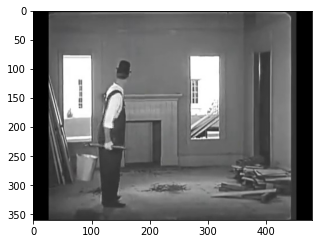

In [42]:
files = sorted(glob.glob(INFERENCE_FOLDER+'/images/*.*g'), key = lambda x: int(Path(x).stem))
plt.figure(figsize=(5,5))
plt.imshow(PIL.Image.open(random.choice(files)))

# Do inference

In [67]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [68]:
# learn = load_learner("/content/drive/My Drive/video_restorer/")
# learn = load_learner("/content/drive/My Drive/video_restorer3/")
# learn = load_learner("/content/drive/My Drive/video_restorer4/")
# learn = load_learner("/content/drive/My Drive/video_restorer5/")
learn = load_learner("/content/drive/My Drive/lh_restorer/")

In [69]:
def run_inference_images(file, dest):

  img = open_image(file)
  p,img_hr,b = learn.predict(img)

  # Image(img_hr).save(dest)
  Image(img_hr).show(figsize=(25,25))
  plt.savefig(dest, bbox_inches = 'tight', pad_inches = 0)
  plt.close()

def scale_to_square(orig, targ, dest):
  # a simple stretch to fit a square really makes a big difference in rendering quality/consistency.
  # I've tried padding to the square as well (reflect, symetric, constant, etc).  Not as good!
  targ_sz = (targ, targ)
  orig = orig.resize(targ_sz, resample=PIL.Image.BILINEAR)
  orig.save(dest)
  return dest

def unsquare(image, orig, dest):
  targ_sz = orig.size
  image = image.resize(targ_sz, resample=PIL.Image.BILINEAR)
  image.save(dest)
  return dest

def adjust_brightness(img, factor, dest):
  enhancer = PIL.ImageEnhance.Brightness(img)
  img = enhancer.enhance(factor)
  os.remove(dest)
  img.save(dest)
  return img

def plot_img(path):
  plt.imshow(PIL.Image.open(path))
  plt.show()

In [70]:
%%capture
render_factor = 40
ADJUST_BRIGHTNESS = False

if os.path.exists('imagepaths.txt'):
  os.remove('imagepaths.txt')

!rm -Rf $INFERENCE_FOLDER/high_res/
!mkdir $INFERENCE_FOLDER/high_res/

# def write_to_txt(dest):
#   file = open("imagepaths.txt", "a") 
#   write = "file '" + dest.strip() + "'" + "\n"
#   file.write(write) 
#   file.close() 

files = sorted(glob.glob(INFERENCE_FOLDER+'/images/*.*g'), key = lambda x: int(os.path.basename(x).split('.')[0]))
files = files[100:]

for file in tqdm(files):

  gc.collect()
  # file = random.choice(files)
  dest = INFERENCE_FOLDER+'/high_res/'+os.path.basename(file)
  # plot_img(file)

  # scale to square
  new_path = scale_to_square(PIL.Image.open(file), render_factor*16, dest = dest.split('.')[0]+'_square.jpg')

  # run inference
  run_inference_images(new_path, dest)
  # plot_img(new_path)

  # unsquare
  dest = unsquare(PIL.Image.open(dest), PIL.Image.open(file), dest = dest.split('.')[0]+'_unsquared.jpg')
  # plot_img(dest)

  # write to txt
  # write_to_txt(dest)

  # increase brightness
  if (ADJUST_BRIGHTNESS): adjust_brightness(PIL.Image.open(dest),factor = 1.5, dest=dest); plot_img(dest)


KeyboardInterrupt: ignored

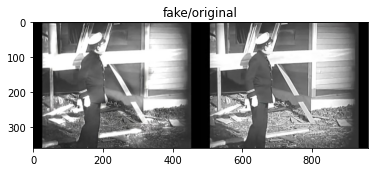

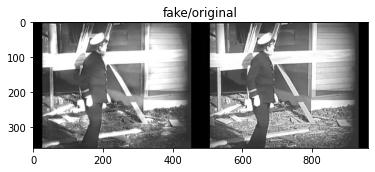

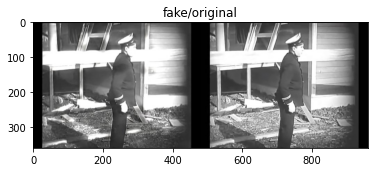

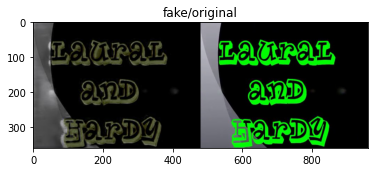

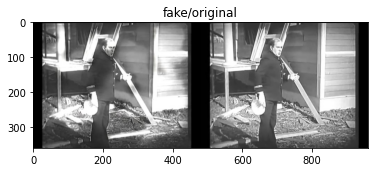

In [71]:
import random
import PIL
import matplotlib.pyplot as plt

def combine_images_side_by_side(img1, img2, title):

  images = [PIL.Image.open(img1), PIL.Image.open(img2)]
  widths, heights = zip(*(i.size for i in images))

  total_width = sum(widths)
  max_height = max(heights)

  new_im = PIL.Image.new('RGB', (total_width, max_height))

  x_offset = 0
  for im in images:
    new_im.paste(im, (x_offset,0))
    x_offset += im.size[0]

  plt.imshow(new_im)
  plt.title(title)
  plt.show()

def get_original_photo(path):
  return str(path).replace('high_res', 'images').replace('_unsquared', '')

files = glob.glob(INFERENCE_FOLDER+'/high_res/*_unsquared.*g')
for file in random.sample(files, 5) :
  combine_images_side_by_side(file, get_original_photo(file), title = 'fake/original')

In [79]:
len(files)

1044

# Concat to video

In [90]:
pathOut = 'inference_after.mp4'

In [91]:
import cv2
import numpy as np
import os
from tqdm.notebook import tqdm

cap = cv2.VideoCapture(VIDEO)
clean_fps = cap.get(cv2.CAP_PROP_FPS)
print(clean_fps)

try: os.remove(pathOut)
except: pass

fps = clean_fps
frame_array = []

files = sorted(glob.glob(INFERENCE_FOLDER + '/high_res/*_unsquared.*g'), key = lambda x: int(os.path.basename(x).split('.')[0].split('_')[0]))
print(len(files))

for filename in tqdm(files):
    # reading each files
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    
    # inserting the frames into an image array
    frame_array.append(img)

out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'MP4V'), fps, size)
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()

29.97002997002997
1044


# Show output

In [92]:
def copy_to_drive():

  !mkdir /content/drive/"My Drive"/lh_restorer
  # !cp 'out.mp4' /content/drive/"My Drive"/video_restorer5
  !cp $pathOut /content/drive/"My Drive"/lh_restorer
  !cp $VIDEO /content/drive/"My Drive"/lh_restorer

In [93]:
copy_to_drive()

mkdir: cannot create directory ‘/content/drive/My Drive/lh_restorer’: File exists


In [94]:
def show_short_video(file, quiet = True, seconds = 10):

  output_file = os.path.basename(file).split('.')[0]+'_short.'+os.path.basename(file).split('.')[1]
  end_time = '00:00:' + str(seconds)

  if (quiet == True):
    !ffmpeg -loglevel warning -y -ss 00:00:00 -i $file -c copy -t $end_time $output_file
  else:
    !ffmpeg -y -ss 00:00:00 -i $file -c copy -t $end_time $output_file

  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(output_file,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

In [95]:
show_short_video(pathOut, seconds = 20)

In [96]:
show_short_video(VIDEO, seconds = 20)